# Notes on installation

Pillow can be installed via pip.
```
pip install Pillow
```

In [2]:
# 구글 드라이브 연결(데이터 로드를 위해서)
from google.colab import drive
drive.mount('/content/data')

Mounted at /content/data


In [3]:
import easydict
import json
args = easydict.EasyDict()

# path 정보
args.default_path = '/content/data/MyDrive/ai_lecture/2. Deep Learning/2. Vision Pytorch/Image_Preprocessing/data/'

# Understanding the Image class

In [4]:
from PIL import Image

## Loading images

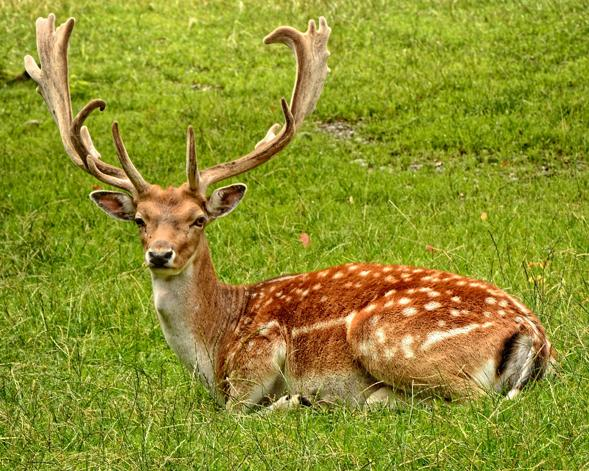

In [5]:
im = Image.open(args.default_path+"deer.jpg")
im

## Save Image

In [6]:
im.save(args.default_path+"save_deer.jpg")

## Bands
Every Image has one or more bands. Using Pillow we can store one or several bands in an image.   
For example, a colored image will usually have 'R', 'G' and 'B' bands for Red, Blue and Green respectively.

In [7]:
im.getbands()

('R', 'G', 'B')

## [JPG vs PNG](https://www.adobe.com/kr/creativecloud/file-types/image/comparison/jpeg-vs-png.html)

### JPG
- JPEG(Joint Photographic Experts Group) 파일은 디지털 사진을 저장하는 가장 일반적인 형식입니다.
- 실제로 많은 최신 카메라들이 이미지 촬영 및 저장에 JPEG 파일 포맷을 사용합니다.
- JPEG는 압축을 통해 이미지 파일 크기를 줄여서 저장하고, 웹 페이지에 쉽게 업로드할 수 있게 합니다.
- JPEG 이미지는 최대 1,600만 개의 색상을 담아낼 수 있습니다.

일반적으로 JPG는 color 채널의 크기(R, G, B)가 3이다.

### PNG
- PNG(Portable Network Graphics) 파일은 압축 가능하며, JPEG처럼 1,600만 개의 색상을 처리할 수 있습니다.
- 하지만 JPEG보다 저장 공간을 더 많이 차지하기 때문에 고품질 사진보다는 웹 그래픽, 로고, 차트, 일러스트레이션에 사용됩니다.
- `JPEG와 달리 투명한 배경이 있는 그래픽을 처리할 수 있다는 장점이 있습니다.`

일반적으로 PNG는 color 채널의 크기(투명도 추가)가 4이다.

## Modes

Mode refers to the type and depth of a pixel in an image.
- `L` for black and white
- `RGB` for true color
- `RGBA` for true color with transparency mask
- `YCbCr` for color video format

In [8]:
im.mode

'RGB'

## Size

We can also obtain the dimensions of an image via the image attribute

In [9]:
width, hight = im.size # (width, hight)
width, hight

(589, 471)

In [10]:
import numpy as np

# (height, width, color)
np.array(im).shape

(471, 589, 3)

# Image manipulation
> 이미지 조작

## Cropping images

Inorder to crop an image, we start by defining a box that dictates the area of the image that we would like to crop.   
Next, we pass that box to the `crop` function of the Image class.

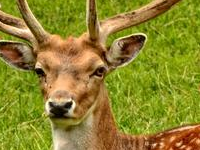

In [11]:
box = (100, 150, 300, 300)
cropped_image = im.crop(box)
cropped_image

## rotating images

Rotating an image is done via the `rotate` function of the Image class.

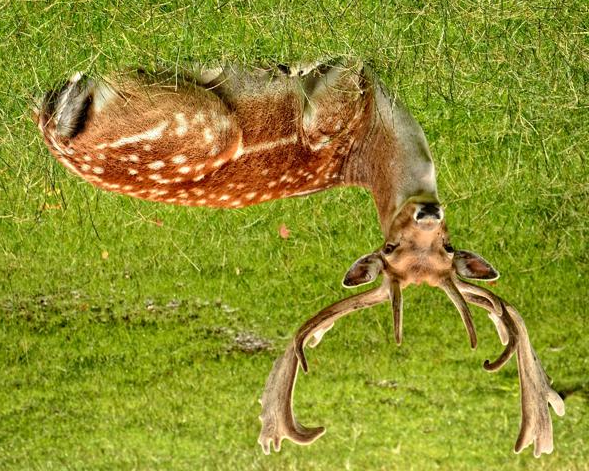

In [12]:
rotated = im.rotate(180)
rotated

## Merging images

The package also allows us to merge two images. Let's illustrate that by merging a logo into the image.

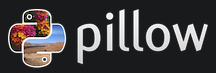

In [13]:
logo = Image.open(args.default_path+"logo_pillow.png")
logo

In [16]:
logo.mode, logo.size

('RGBA', (216, 73))

In [17]:
np.array(logo).shape

(73, 216, 4)

In [21]:
np.array(logo)[:2]

array([[[ 25,  26,  28, 255],
        [ 25,  26,  28, 255],
        [ 25,  26,  28, 255],
        ...,
        [ 25,  26,  28, 255],
        [ 25,  26,  28, 255],
        [ 25,  26,  28, 255]],

       [[ 25,  26,  28, 255],
        [ 25,  26,  28, 255],
        [ 25,  26,  28, 255],
        ...,
        [ 25,  26,  28, 255],
        [ 25,  26,  28, 255],
        [ 25,  26,  28, 255]]], dtype=uint8)

- 채도(A) 제거

In [22]:
# logo -> (높이, 너비, 컬러)
np.array(logo)[:,:,:3].shape

(73, 216, 3)

This operation takes place in place of the original image. Therefore, if you want to keep the original image, you can make a `copy` of it.

In [23]:
tmp_im = im.copy()

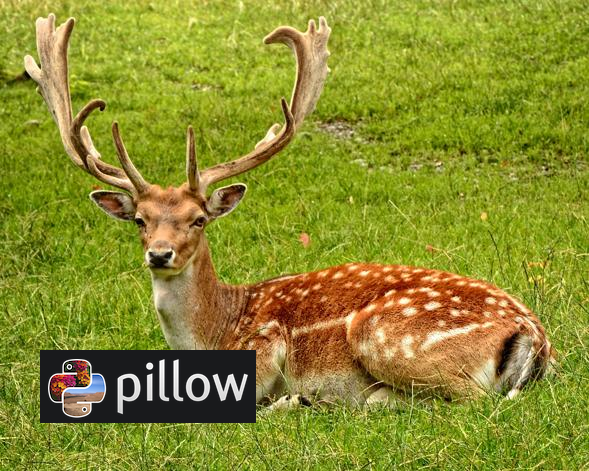

In [24]:
position = (40, 350)
tmp_im.paste(logo, position)
tmp_im

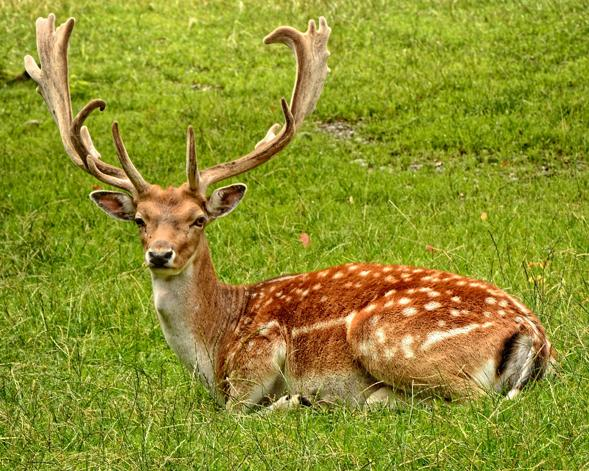

In [25]:
im

## PIL image to Numpy array

In [28]:
import numpy as np

im_array = np.array(im)
im_array.shape

(471, 589, 3)

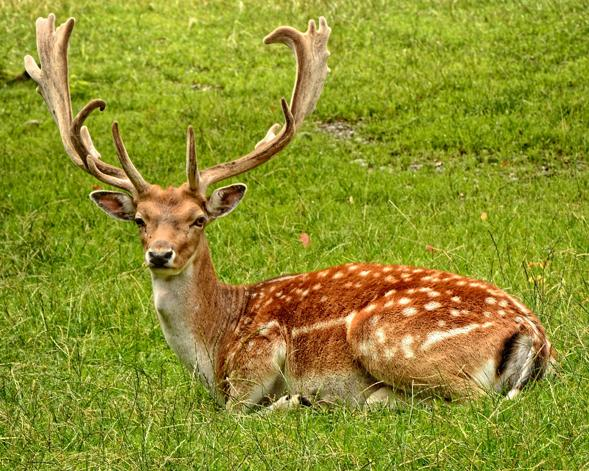

In [27]:
img_np = Image.fromarray(im_array, 'RGB')
img_np

## Color transformations

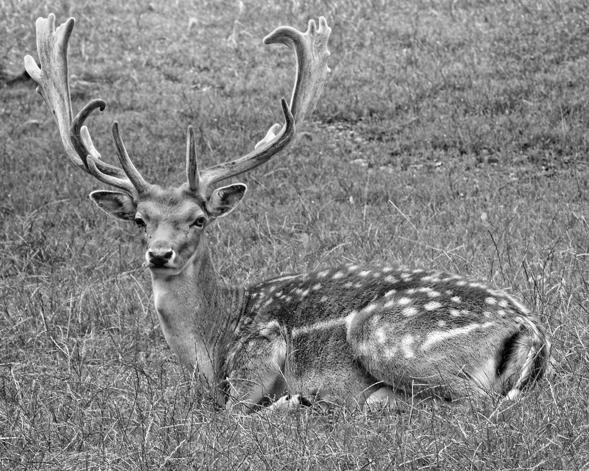

In [29]:
im.convert('L')

# Image enhancement
> 이미지 향상

In [30]:
from PIL import ImageEnhance

For example, we can adjust the image sharpness

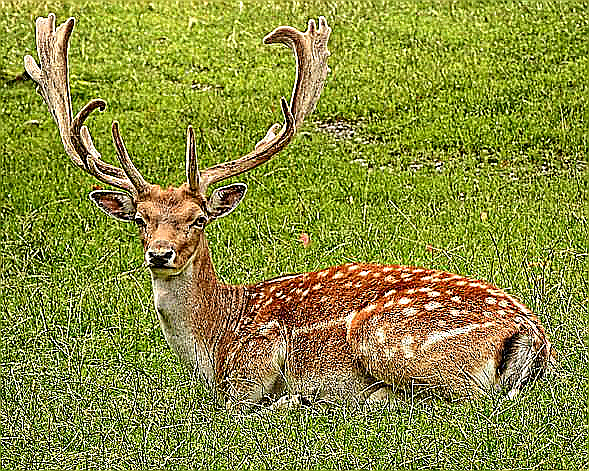

In [31]:
enhancer = ImageEnhance.Sharpness(im)
enhancer.enhance(10.0)

Let's take another example where we double the brightness of the image.

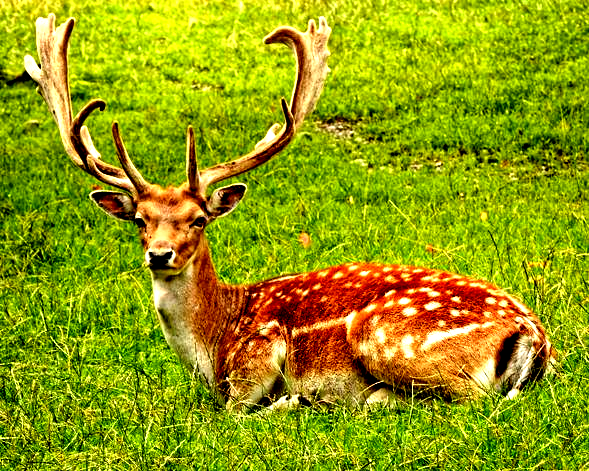

In [32]:
enhancer = ImageEnhance.Contrast(im)
enhancer.enhance(2)

## Filters

In [33]:
from PIL import ImageFilter

- BLUR

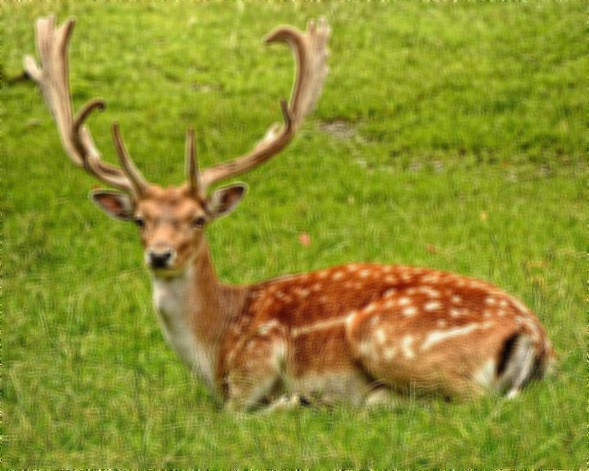

In [34]:
im.filter(ImageFilter.BLUR)

- CONTOUR

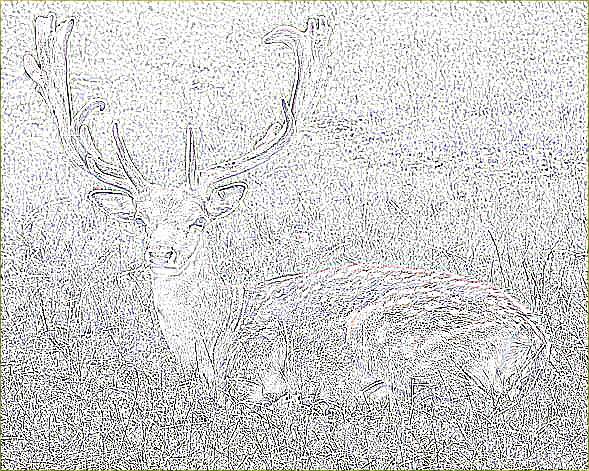

In [35]:
im.filter(ImageFilter.CONTOUR)

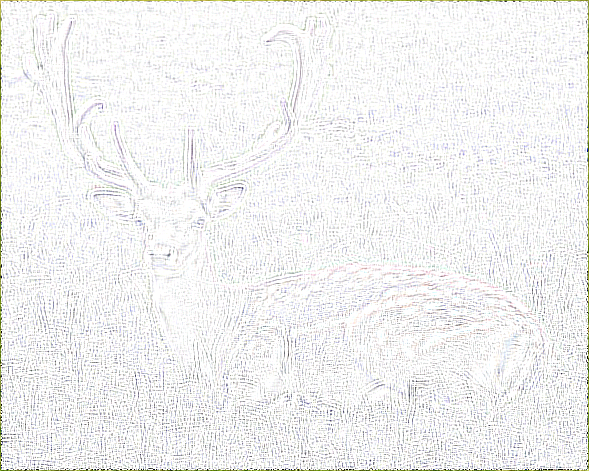

In [36]:
im.filter(ImageFilter.BLUR).filter(ImageFilter.CONTOUR)

- DETAIL

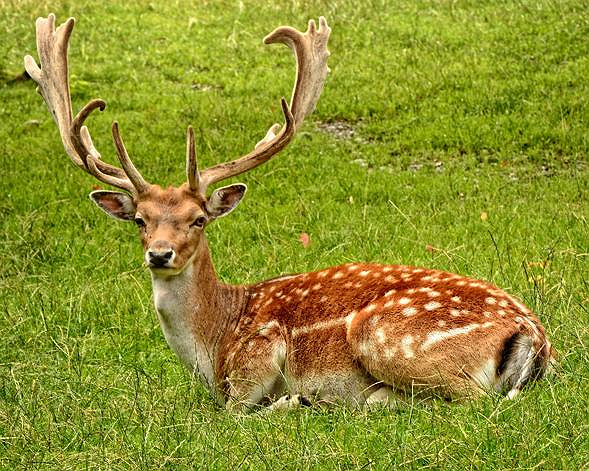

In [37]:
im.filter(ImageFilter.DETAIL)

- EDGE_ENHANCE

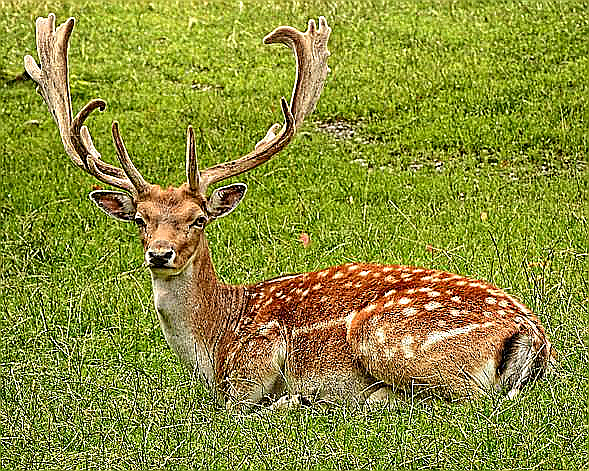

In [38]:
im.filter(ImageFilter.EDGE_ENHANCE)

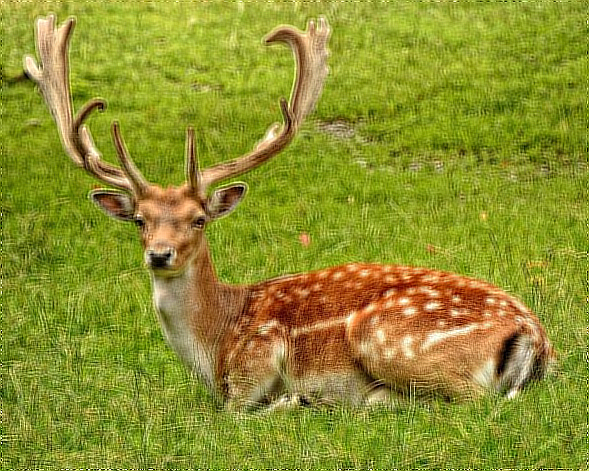

In [39]:
im.filter(ImageFilter.BLUR).filter(ImageFilter.EDGE_ENHANCE)

- EMBOSS

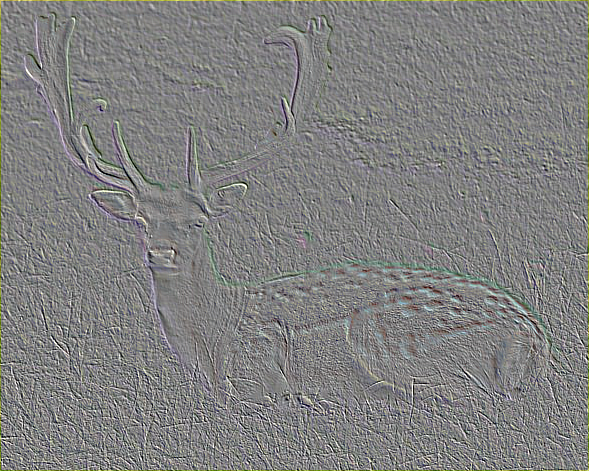

In [40]:
im.filter(ImageFilter.EMBOSS)

- FIND_EDGES

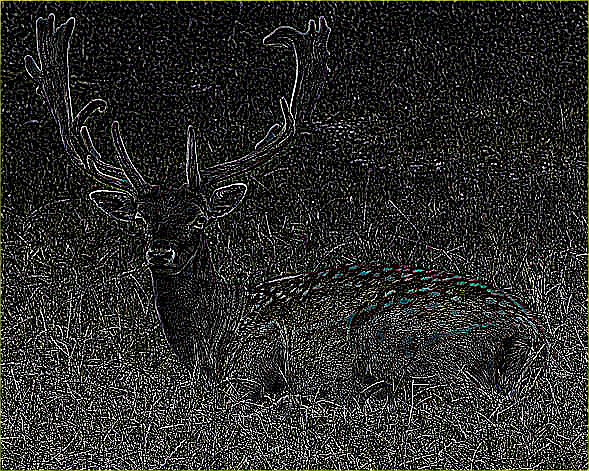

In [41]:
im.filter(ImageFilter.FIND_EDGES)

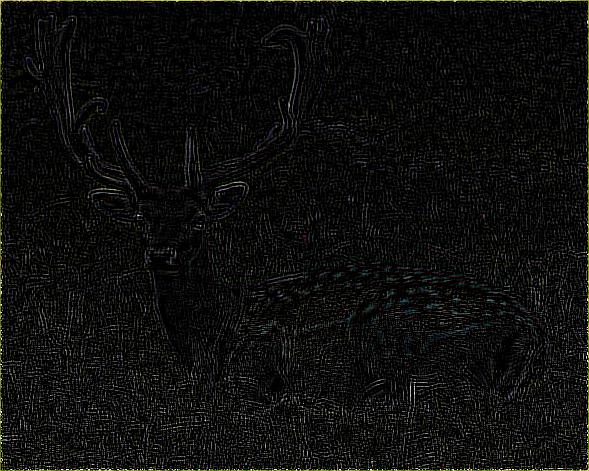

In [42]:
im.filter(ImageFilter.BLUR).filter(ImageFilter.FIND_EDGES)